In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import matplotlib.dates as mdates
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

import scipy.stats as stats

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, r2_score

from utils import describe_ts, draw_resampled, cluster_ts, plot_clustered_series, calculate_tau, calculate_slope

### Данные из transformers_articles

#### ECL: Electricity Consuming Load

Contains hourly electricity consumption (in Kwh) of 321 clients in two years.

In [4]:
ecl = pd.read_csv('data/transformers_articles/ECL.csv')
ecl.head()

,date,MT_000,MT_001,MT_002,MT_003,MT_004,MT_005,MT_006,MT_007,MT_008,...,MT_311,MT_312,MT_313,MT_314,MT_315,MT_316,MT_317,MT_318,MT_319,MT_320
0,2012-01-01 00:00:00,14.0,69.0,234.0,415.0,215.0,1056.0,29.0,840.0,226.0,...,676.0,372.0,80100.0,4719.0,5002.0,48.0,38.0,1558.0,182.0,2162.0
1,2012-01-01 01:00:00,18.0,92.0,312.0,556.0,292.0,1363.0,29.0,1102.0,271.0,...,805.0,452.0,95200.0,4643.0,6617.0,65.0,47.0,2177.0,253.0,2835.0
2,2012-01-01 02:00:00,21.0,96.0,312.0,560.0,272.0,1240.0,29.0,1025.0,270.0,...,817.0,430.0,96600.0,4285.0,6571.0,64.0,43.0,2193.0,218.0,2764.0
3,2012-01-01 03:00:00,20.0,92.0,312.0,443.0,213.0,845.0,24.0,833.0,179.0,...,801.0,291.0,94500.0,4222.0,6365.0,65.0,39.0,1315.0,195.0,2735.0
4,2012-01-01 04:00:00,22.0,91.0,312.0,346.0,190.0,647.0,16.0,733.0,186.0,...,807.0,279.0,91300.0,4116.0,6298.0,75.0,40.0,1378.0,191.0,2721.0


Переведем в нужный формат.

In [5]:
ecl = pd.melt(ecl, id_vars=['date'])
ecl['variable'] = ecl['variable'].astype('category').cat.codes
ecl = ecl.rename(columns={'variable': 'id'})
ecl['date'] = pd.to_datetime(ecl['date'])

Приведем основные необходимые характеристики ряда.

In [6]:
describe_ts(ecl)

Число рядов: 321
Наблюдений в ряде: [26304]
Минимальная дата в ряде: 2012-01-01 00:00:00
Максимальная дата в ряде: 2014-12-31 23:00:00, 

count    8.443584e+06
mean     2.538792e+03
std      1.502757e+04
min      0.000000e+00
25%      2.410000e+02
50%      5.500000e+02
75%      1.387000e+03
max      7.640000e+05
Name: value, dtype: float64


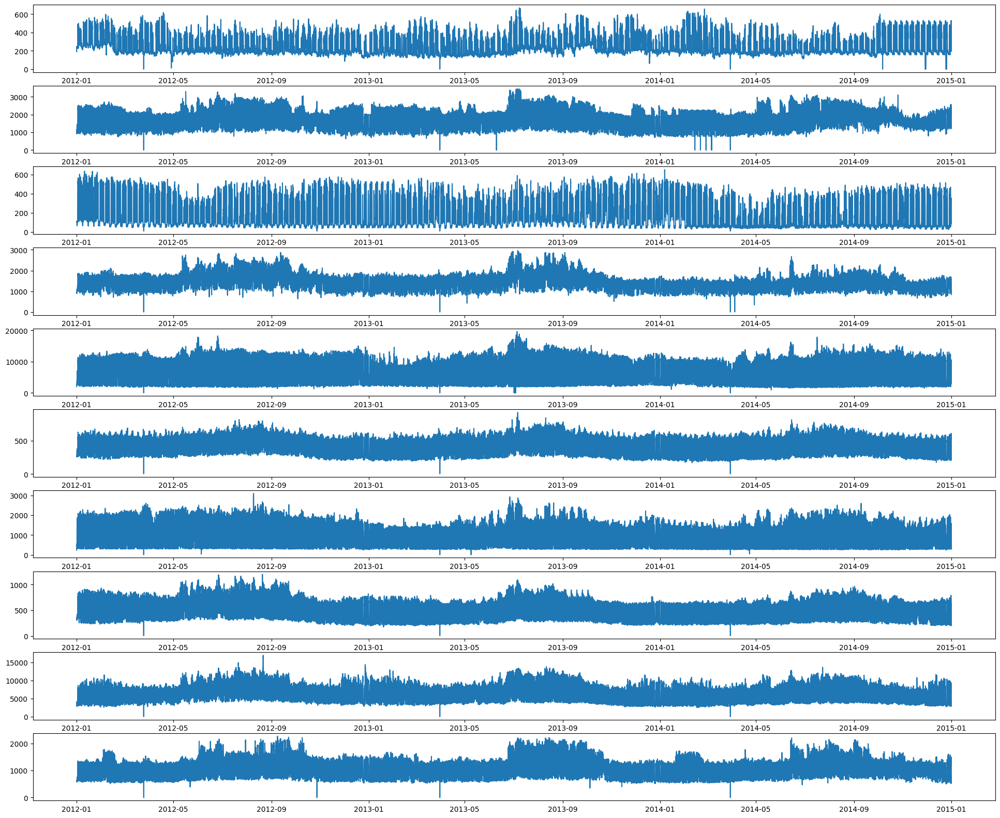

In [7]:
draw_resampled(ecl, 'H', 10)

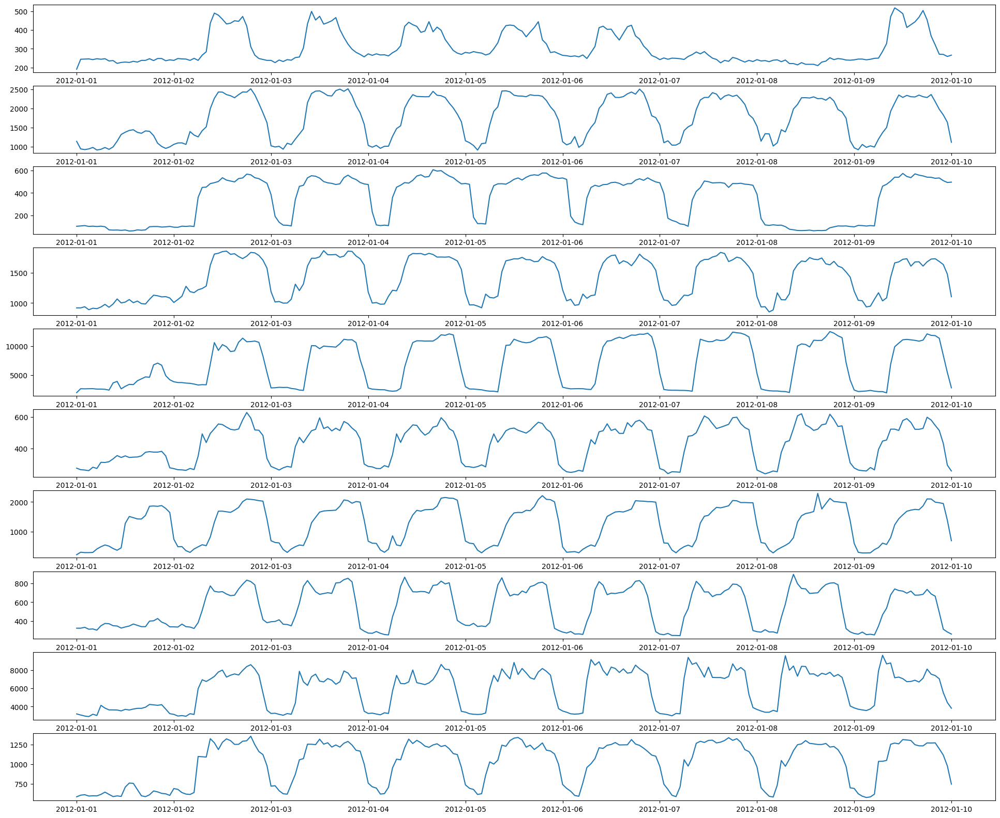

In [8]:
# Сезонность внутри дня
draw_resampled(ecl[(ecl["date"] >= "2012-01-01 00:00:00") & (ecl["date"] <= "2012-01-10 00:00:00")], 'H', 10)

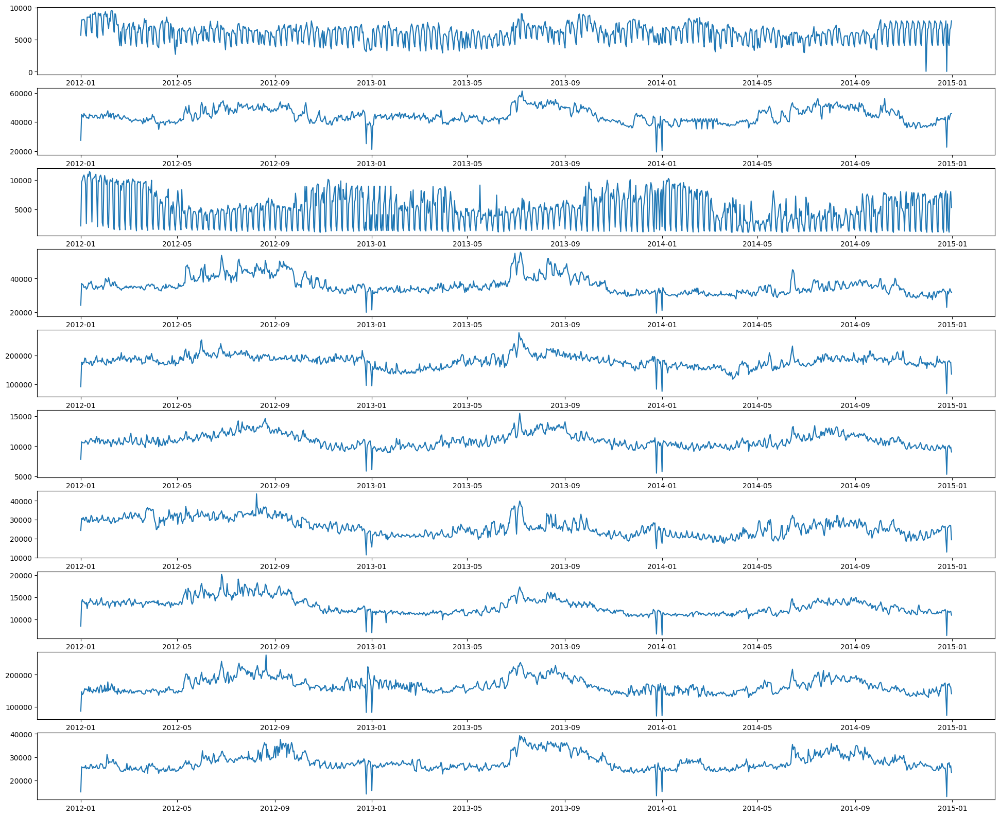

In [9]:
# Сезонность внутри недели
draw_resampled(ecl, 'D', 10)

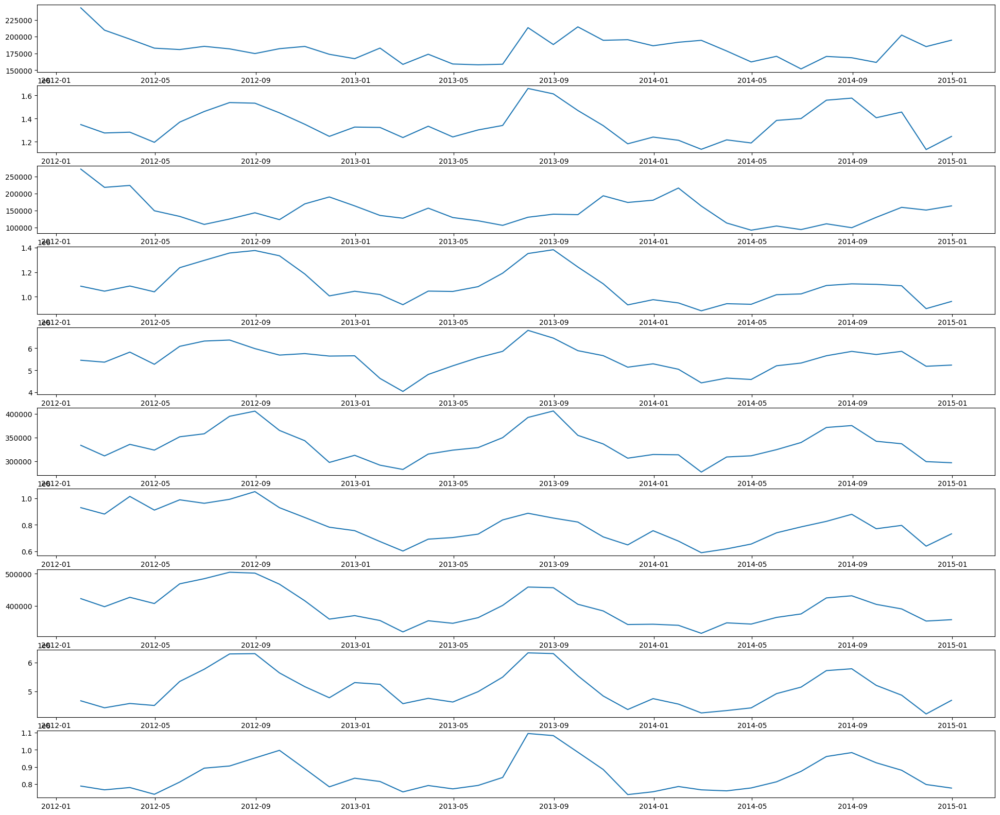

In [10]:
# Сезонность внутри месяца
draw_resampled(ecl, 'M', 10)

Ряды довольно разнородные. Наблюдается суточная сезонность, недельная сезонность, месячнная сезонность.

В некоторых рядах наблюдается level shift.

Есть ряды с отрезками, где значения нулевые.

Попробуем покластеризовать ряды

In [11]:
ecl_cluster = cluster_ts(ecl, 10)

c:\Users\User\.conda\envs\educ_kernel\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


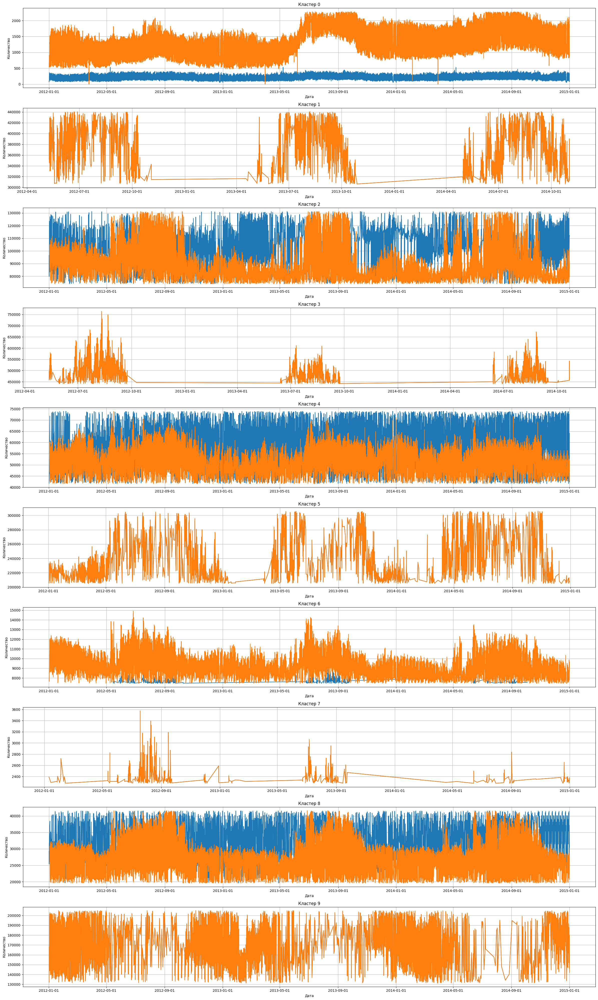

In [12]:
plot_clustered_series(ecl_cluster, 10, n_series=2)

In [13]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(ecl, location_col = 'id', quantity_col = 'value', location_list = ecl['id'].unique())
tau_df = calculate_tau(ecl, location_col = 'id', quantity_col = 'value', location_list = ecl['id'].unique())

In [14]:
lr_df

,gradient,mae,mean,r2_score,mape
0,-0.000309,19.351207,23.263762,0.009441,0.831818
1,0.000034,19.954547,112.885569,0.000102,0.176768
2,-0.001710,17.271340,16.821624,0.069653,1.026734
3,0.004108,114.470068,440.335196,0.041788,0.259961
4,0.000781,54.766106,200.536724,0.007228,0.273098
...,...,...,...,...,...
316,-0.002585,199.992773,350.702137,0.006619,0.570264
317,-0.000313,28.331806,51.490344,0.004076,0.550235
318,-0.003115,411.118039,2264.188641,0.001881,0.181574
319,0.000269,224.822870,507.008858,0.000058,0.443430


In [15]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].iloc[:10].style.bar(subset = 'gradient',align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
155,-0.370683
128,0.179217
182,-0.122809
131,-0.072856
314,-0.068558
313,-0.058298
119,-0.050906
296,-0.042101
55,0.039192
236,0.036674


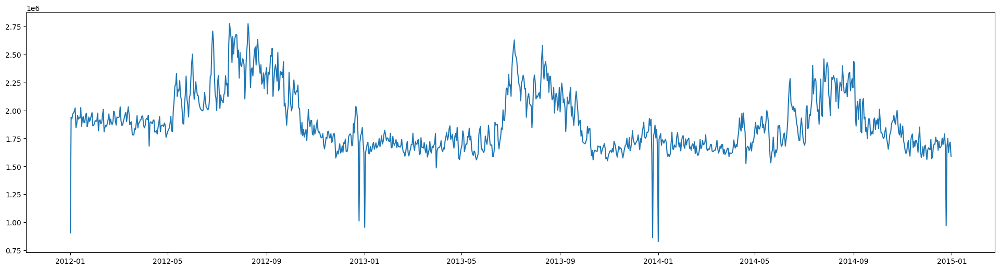

In [16]:
draw_resampled(ecl[ecl['id'] == 155], 'D', 1)

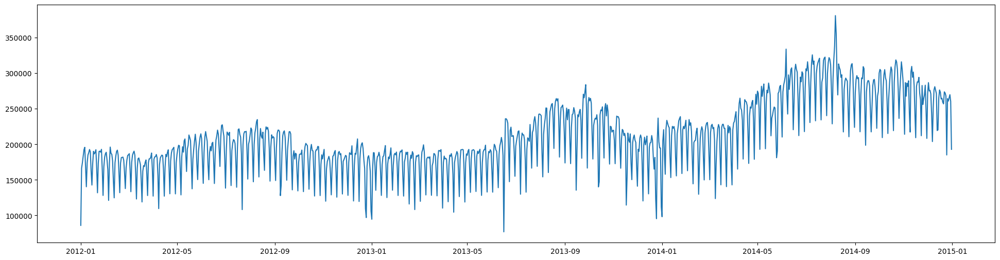

In [17]:
draw_resampled(ecl[ecl['id'] == 128], 'D', 1)

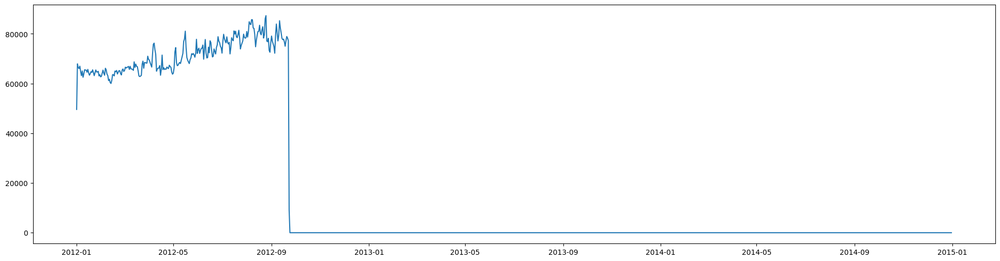

In [18]:
draw_resampled(ecl[ecl['id'] == 182], 'D', 1)

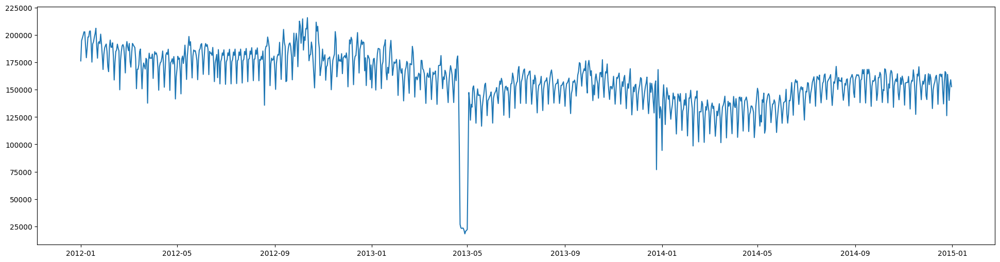

In [19]:
draw_resampled(ecl[ecl['id'] == 131], 'D', 1)

#### ETTm1: Electricity Transformer Temperature-minutely

Contains the 7 indicators of an electricity transformer in two years, including oil temperature, useful load, etc.

In [22]:
ettm1 = pd.read_csv('data/transformers_articles/ETTm1.csv')
ettm1.head()

,date,HUFL,HULL,MUFL,MULL,LUFL,LULL,OT
0,2016-07-01 00:00:00,5.827,2.009,1.599,0.462,4.203,1.340,30.531000
1,2016-07-01 00:15:00,5.760,2.076,1.492,0.426,4.264,1.401,30.459999
2,2016-07-01 00:30:00,5.760,1.942,1.492,0.391,4.234,1.310,30.038000
3,2016-07-01 00:45:00,5.760,1.942,1.492,0.426,4.234,1.310,27.013000
4,2016-07-01 01:00:00,5.693,2.076,1.492,0.426,4.142,1.371,27.787001


Переведем в нужный формат.

In [23]:
ettm1 = pd.melt(ettm1, id_vars=['date'])
ettm1['variable'] = ettm1['variable'].astype('category').cat.codes
ettm1 = ettm1.rename(columns={'variable': 'id'})
ettm1['date'] = pd.to_datetime(ettm1['date'])

Приведем основные необходимые характеристики ряда.

In [24]:
describe_ts(ettm1)

Число рядов: 7
Наблюдений в ряде: [69680]
Минимальная дата в ряде: 2016-07-01 00:00:00
Максимальная дата в ряде: 2018-06-26 19:45:00, 

count    487760.000000
mean          4.593655
std           6.534157
min         -26.367001
25%           1.036000
50%           2.924000
75%           7.320000
max          46.007000
Name: value, dtype: float64


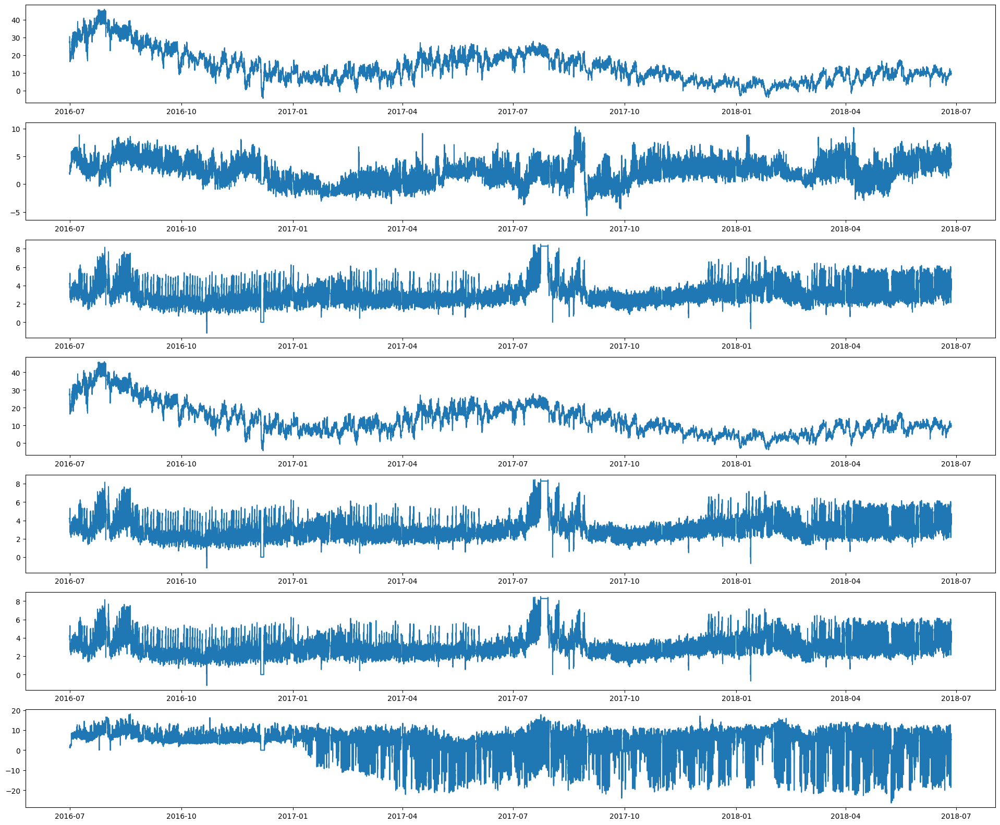

In [28]:
draw_resampled(ettm1, '15min', 7)

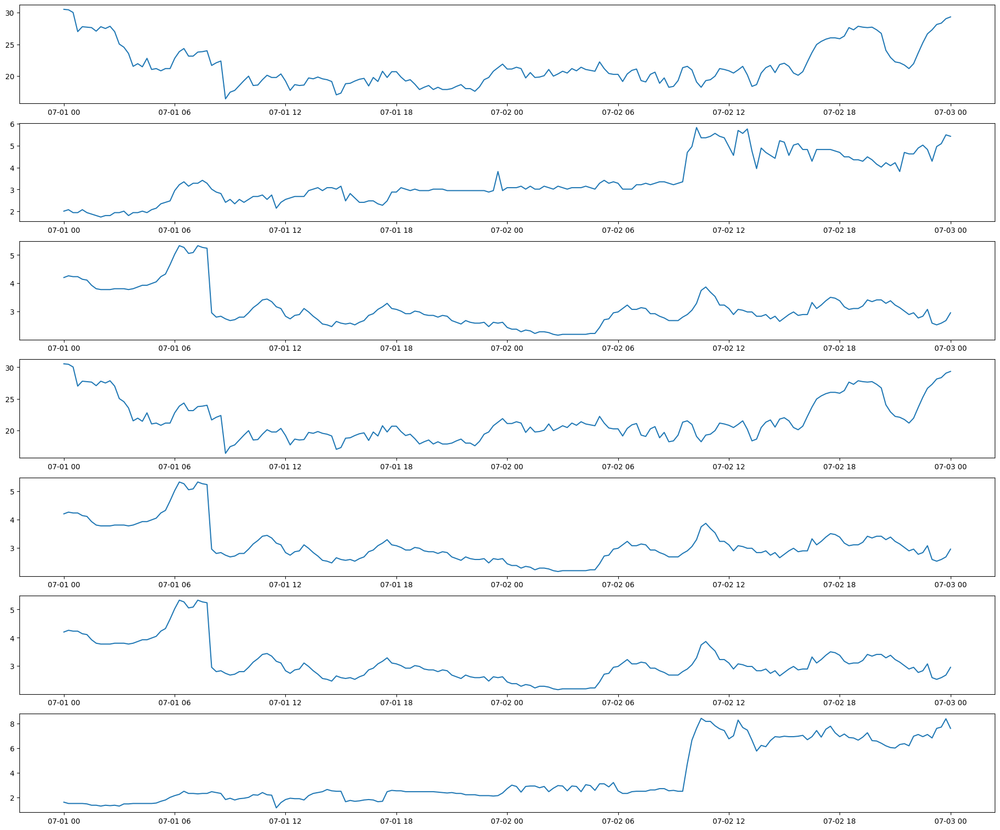

In [31]:
# Сезонность внутри дня
draw_resampled(ettm1[(ettm1["date"] >= "2016-07-01 00:00:00") & (ettm1["date"] <= "2016-07-03 00:00:00")], '15min', 7)

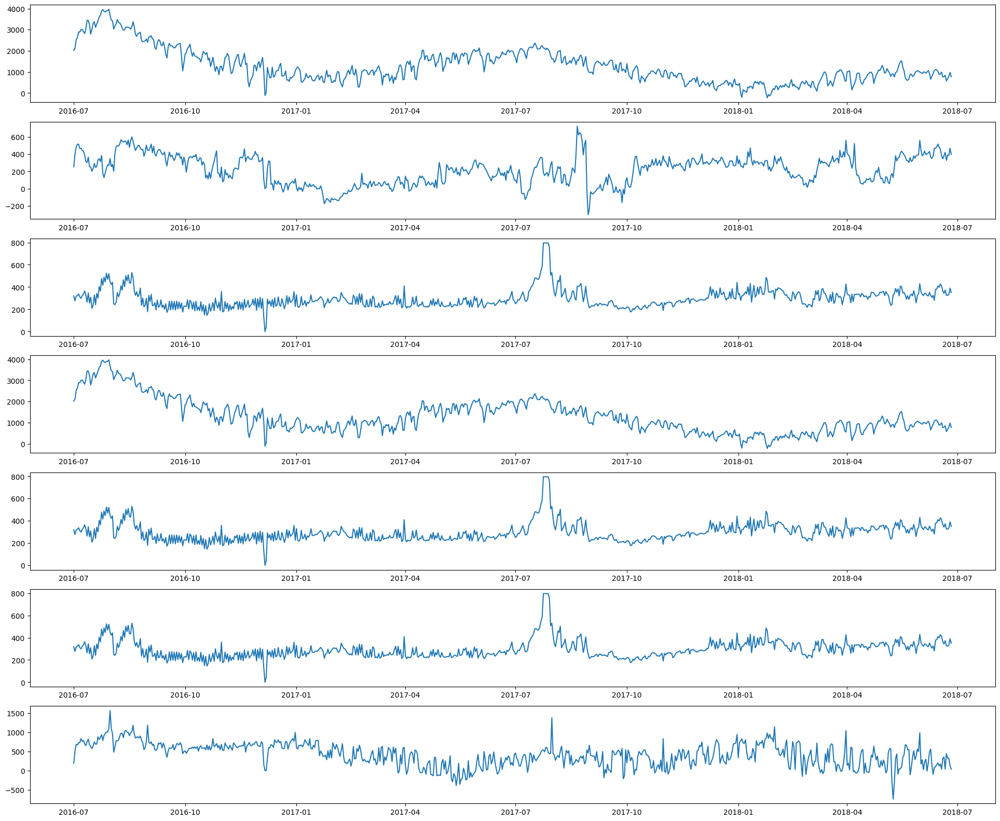

In [32]:
# Сезонность внутри недели
draw_resampled(ettm1, 'D', 7)

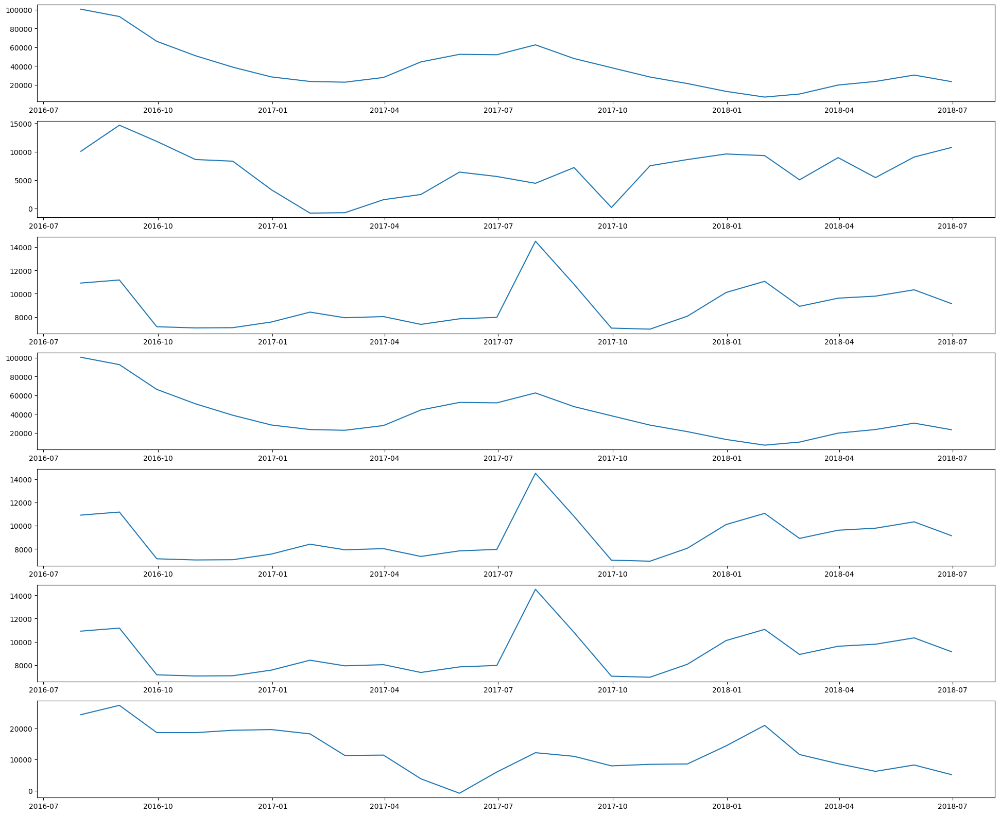

In [33]:
# Сезонность внутри месяца
draw_resampled(ettm1, 'M', 7)

Ряды разнородны. Основания для сезонности наблюдаются в меньшей степени.

В некоторых рядах наблюдается гетерескедастичность.

In [35]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(ettm1, location_col = 'id', quantity_col = 'value', location_list = ettm1['id'].unique())
tau_df = calculate_tau(ettm1, location_col = 'id', quantity_col = 'value', location_list = ettm1['id'].unique())

In [36]:
lr_df

,gradient,mae,mean,r2_score,mape
0,-5.887303e-05,5.046306,7.413993,0.027954,0.680646
1,3.737374e-06,1.654718,2.261418,0.001356,0.731717
4,-6.763165e-05,4.770744,4.322226,0.039683,1.103770
5,1.134735e-07,1.455936,0.896509,0.000002,1.624006
2,9.178643e-06,0.875540,3.082888,0.024729,0.284000
3,3.805356e-06,0.418528,0.857907,0.016251,0.487847
6,-2.655220e-04,5.466454,13.320642,0.388872,0.410375


In [37]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].style.bar(subset = 'gradient',align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
6,-0.000266
4,-0.000068
0,-0.000059
2,0.000009
3,0.000004
1,0.000004
5,0.000000


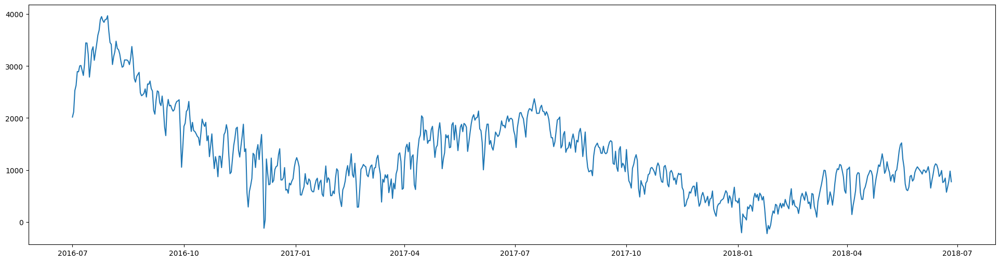

In [39]:
draw_resampled(ettm1[ettm1['id'] == 6], 'D', 1)

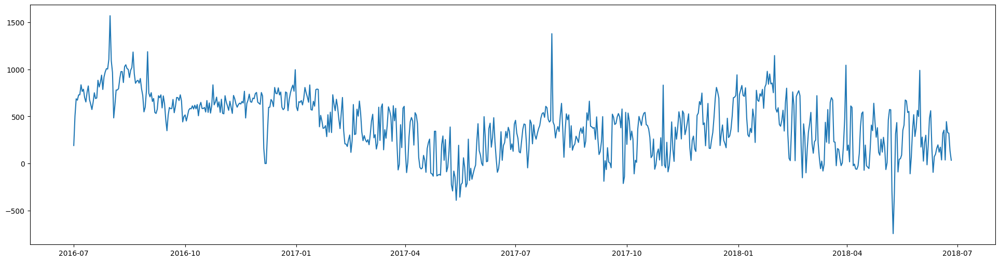

In [40]:
draw_resampled(ettm1[ettm1['id'] == 4], 'D', 1)

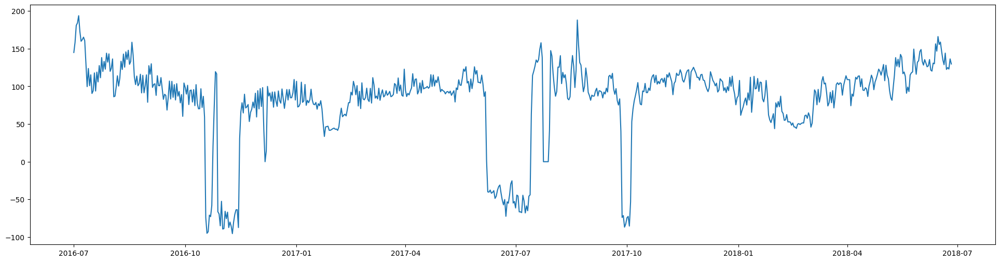

In [41]:
draw_resampled(ettm1[ettm1['id'] == 3], 'D', 1)

#### WTH: Weather

Contains 12 meteorological indicators in U.S. in 4 years, including visibility, wind speed, etc.

In [49]:
wth = pd.read_csv('data/transformers_articles/WTH.csv')
wth.head()

,date,Visibility,DryBulbFarenheit,DryBulbCelsius,WetBulbFarenheit,DewPointFarenheit,DewPointCelsius,RelativeHumidity,WindSpeed,WindDirection,StationPressure,Altimeter,WetBulbCelsius
0,1/1/2010 0:00,10.0,16,-9,13,7,-14,67,7,130,21.65,30.35,-10.3
1,1/1/2010 1:00,10.0,16,-9,13,7,-14,67,5,150,21.64,30.34,-10.3
2,1/1/2010 2:00,10.0,16,-9,13,7,-14,67,5,190,21.65,30.35,-10.3
3,1/1/2010 3:00,10.0,16,-9,13,7,-14,67,7,180,21.65,30.35,-10.3
4,1/1/2010 4:00,10.0,16,-9,14,9,-13,74,6,120,21.64,30.34,-10.0


Переведем в нужный формат.

In [50]:
wth = pd.melt(wth, id_vars=['date'])
wth['variable'] = wth['variable'].astype('category').cat.codes
wth = wth.rename(columns={'variable': 'id'})
wth['date'] = pd.to_datetime(wth['date'])

Приведем основные необходимые характеристики ряда.

In [51]:
describe_ts(wth)

Число рядов: 12
Наблюдений в ряде: [35064]
Минимальная дата в ряде: 2010-01-01 00:00:00
Максимальная дата в ряде: 2013-12-31 23:00:00, 

count    420768.000000
mean         29.092770
std          47.341544
min         -34.000000
25%           5.000000
50%          19.000000
75%          31.000000
max         360.000000
Name: value, dtype: float64


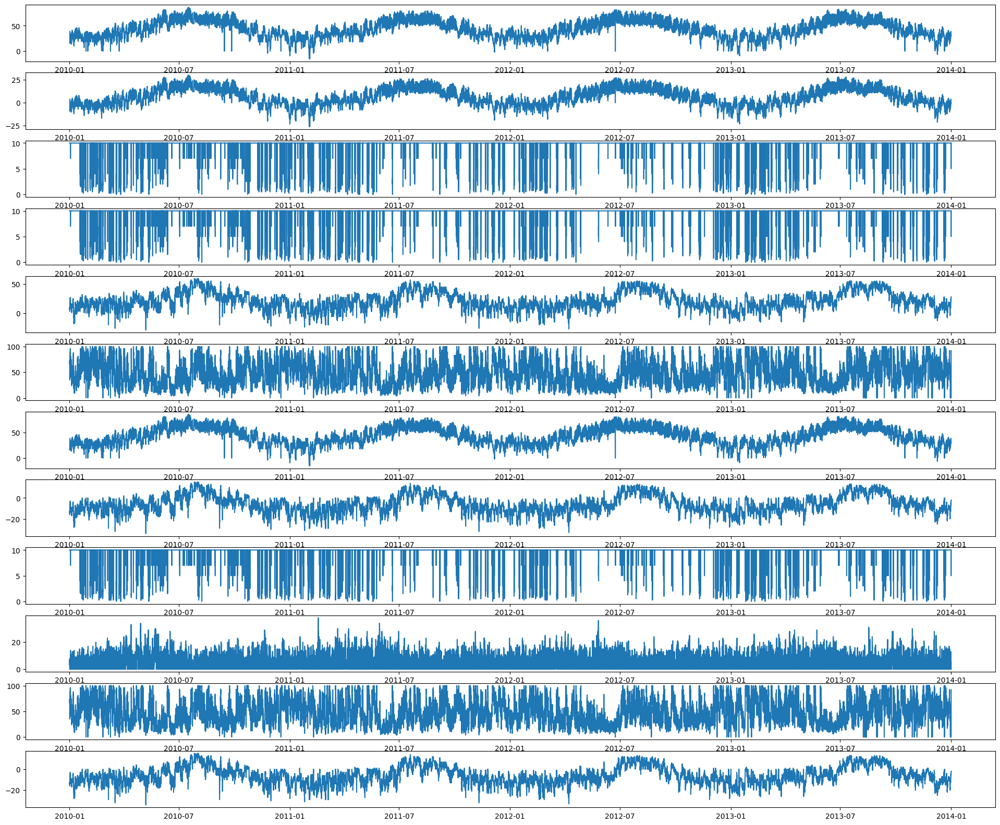

In [52]:
draw_resampled(wth, 'H', 12)

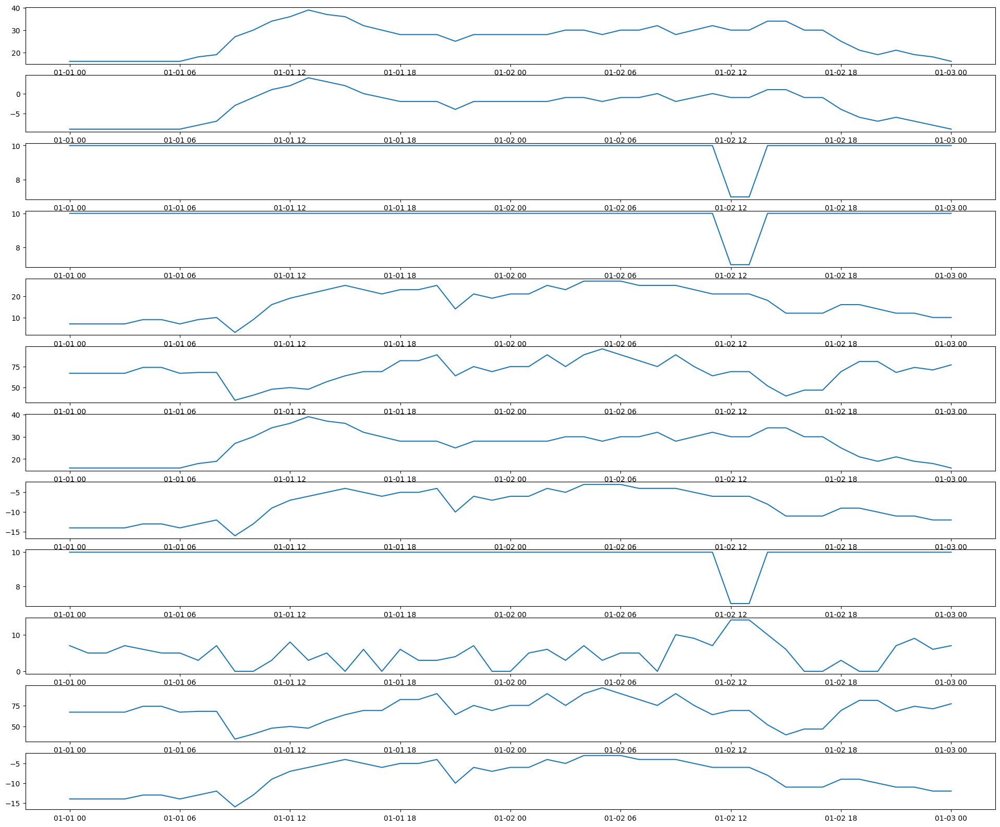

In [53]:
# Сезонность внутри дня
draw_resampled(wth[(wth["date"] >= "2010-01-01 00:00:00") & (wth["date"] <= "2010-01-03 00:00:00")], 'H', 12)

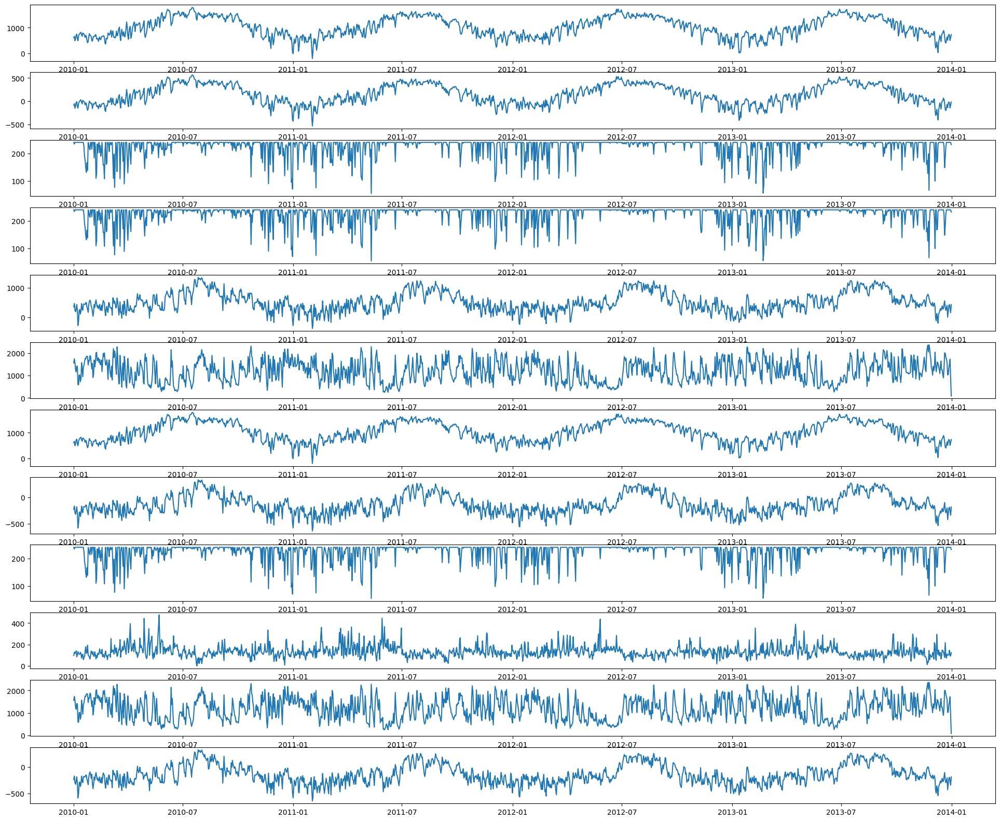

In [54]:
# Сезонность внутри недели
draw_resampled(wth, 'D', 12)

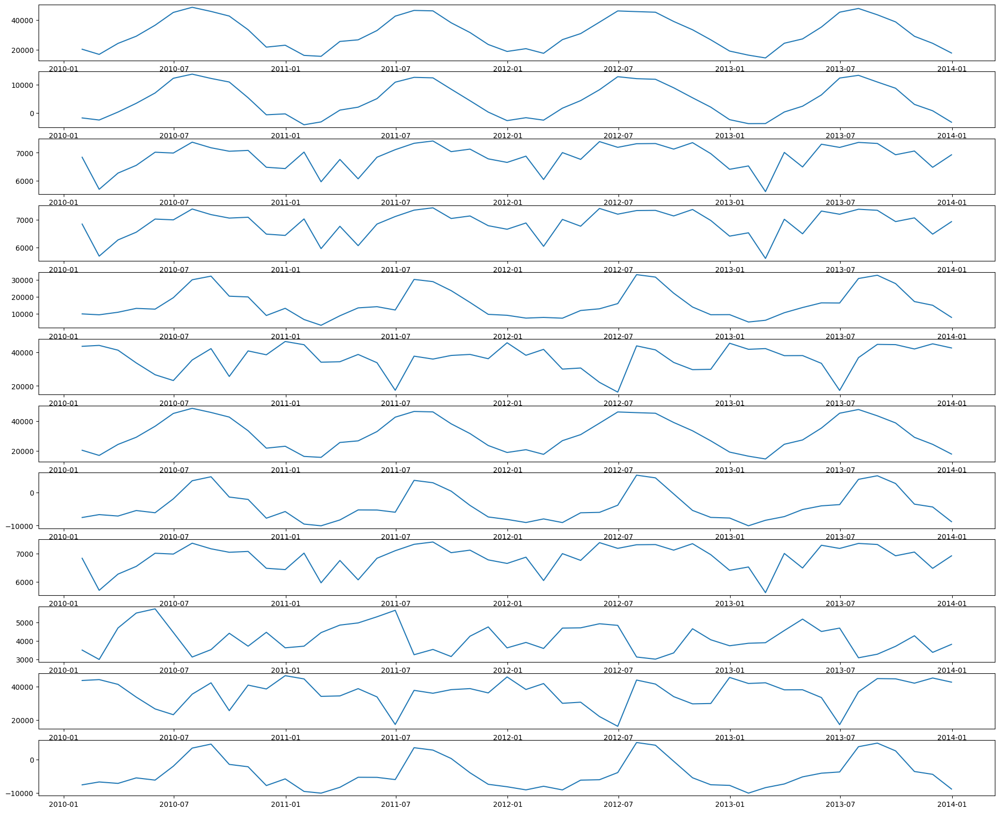

In [55]:
# Сезонность внутри месяца
draw_resampled(wth, 'M', 12)

Ряды очень разнородны. Сезонность так же различается от ряда к ряду.

In [56]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(wth, location_col = 'id', quantity_col = 'value', location_list = wth['id'].unique())
tau_df = calculate_tau(wth, location_col = 'id', quantity_col = 'value', location_list = wth['id'].unique())

In [57]:
lr_df

,gradient,mae,mean,r2_score,mape
7,0.000010,1.109459,9.385894,0.002265,0.118205
4,0.000026,14.382866,42.979438,0.000244,0.334645
3,0.000015,7.948368,6.125000,0.000271,1.297693
9,0.000036,10.447761,33.717944,0.000815,0.309858
2,0.000099,11.701619,21.713068,0.004729,0.538921
1,0.000056,6.478434,-5.677247,0.004910,-1.141122
5,0.000074,21.440594,49.843344,0.000883,0.430160
11,-0.000016,3.708466,5.651580,0.001107,0.656182
10,-0.000693,83.982219,132.617528,0.004715,0.633266
6,0.000002,0.140761,21.530753,0.015485,0.006538


In [58]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].style.bar(subset = 'gradient',align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
10,-0.000693
2,0.000099
5,0.000074
1,0.000056
9,0.000036
8,0.000027
4,0.000026
11,-0.000016
3,0.000015
7,0.000010


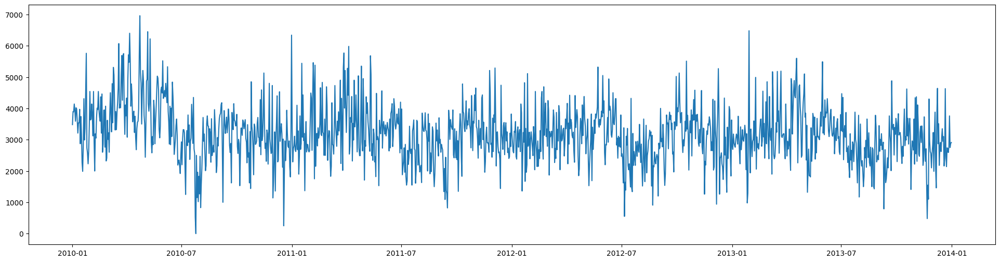

In [63]:
draw_resampled(wth[wth['id'] == 10], 'D', 1)

#### ILI: Influenza-Like illness

Contains 12 meteorological indicators in U.S. in 4 years, including visibility, wind speed, etc.

In [ ]:
wth = pd.read_csv('data/transformers_articles/WTH.csv')
wth.head()

,date,Visibility,DryBulbFarenheit,DryBulbCelsius,WetBulbFarenheit,DewPointFarenheit,DewPointCelsius,RelativeHumidity,WindSpeed,WindDirection,StationPressure,Altimeter,WetBulbCelsius
0,1/1/2010 0:00,10.0,16,-9,13,7,-14,67,7,130,21.65,30.35,-10.3
1,1/1/2010 1:00,10.0,16,-9,13,7,-14,67,5,150,21.64,30.34,-10.3
2,1/1/2010 2:00,10.0,16,-9,13,7,-14,67,5,190,21.65,30.35,-10.3
3,1/1/2010 3:00,10.0,16,-9,13,7,-14,67,7,180,21.65,30.35,-10.3
4,1/1/2010 4:00,10.0,16,-9,14,9,-13,74,6,120,21.64,30.34,-10.0


Переведем в нужный формат.

In [ ]:
wth = pd.melt(wth, id_vars=['date'])
wth['variable'] = wth['variable'].astype('category').cat.codes
wth = wth.rename(columns={'variable': 'id'})
wth['date'] = pd.to_datetime(wth['date'])

Приведем основные необходимые характеристики ряда.

In [ ]:
describe_ts(wth)

Число рядов: 12
Наблюдений в ряде: [35064]
Минимальная дата в ряде: 2010-01-01 00:00:00
Максимальная дата в ряде: 2013-12-31 23:00:00, 

count    420768.000000
mean         29.092770
std          47.341544
min         -34.000000
25%           5.000000
50%          19.000000
75%          31.000000
max         360.000000
Name: value, dtype: float64


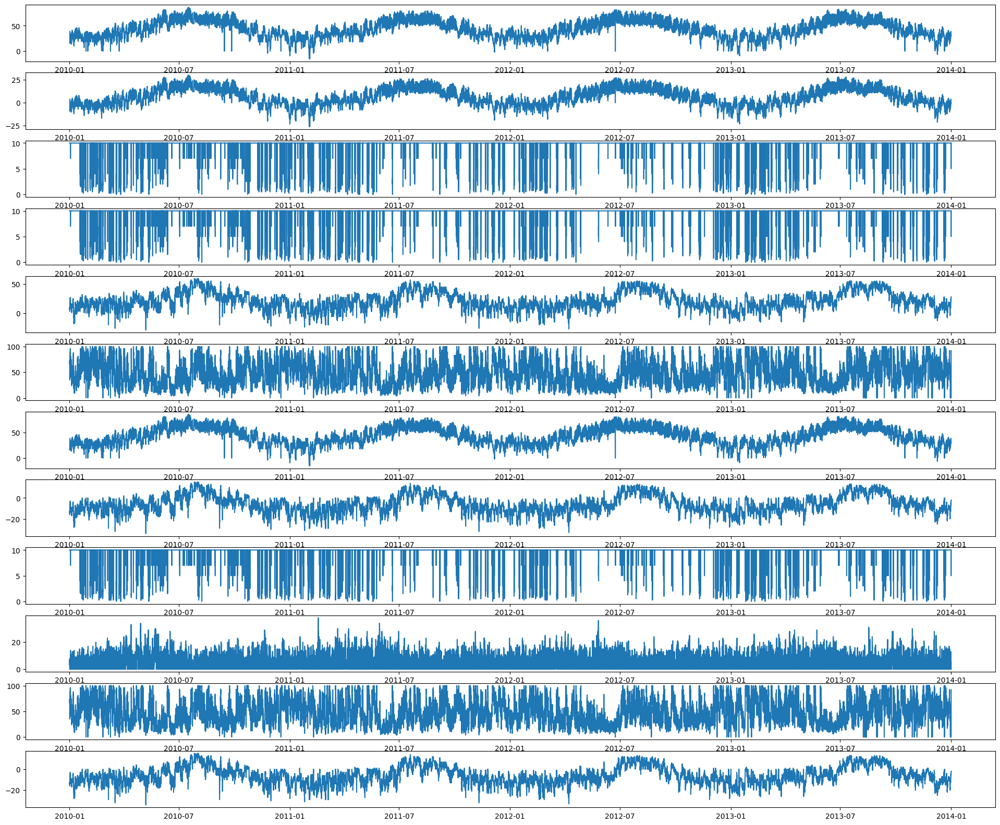

In [ ]:
draw_resampled(wth, 'H', 12)

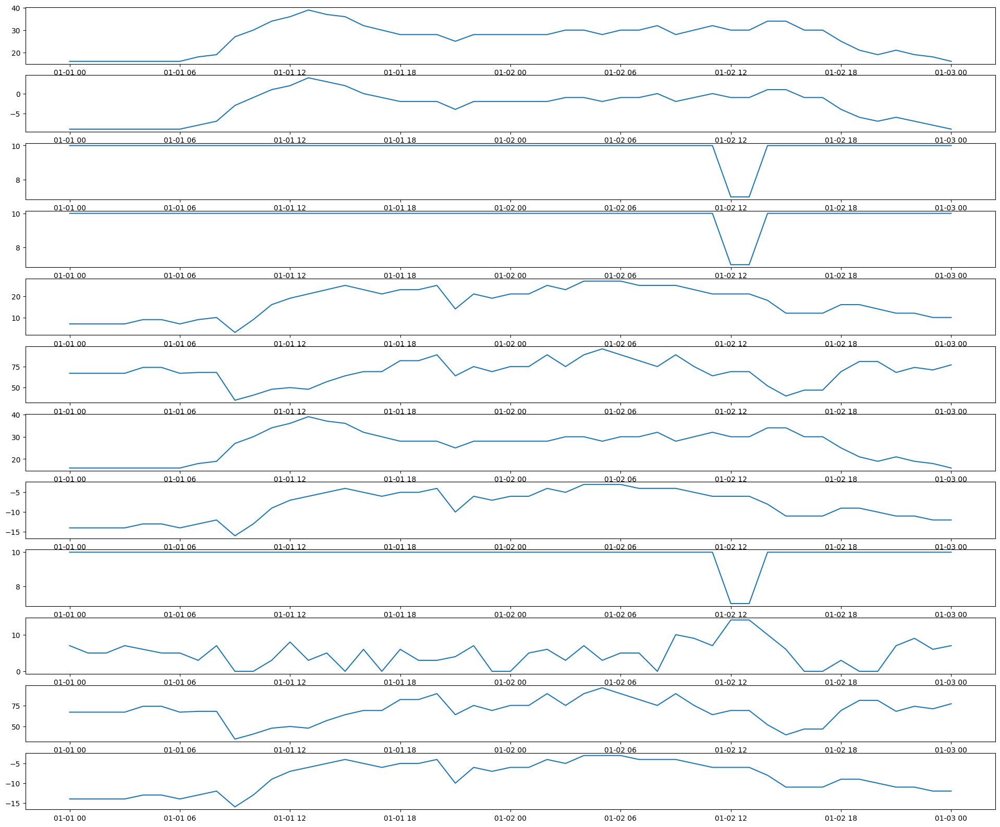

In [ ]:
# Сезонность внутри дня
draw_resampled(wth[(wth["date"] >= "2010-01-01 00:00:00") & (wth["date"] <= "2010-01-03 00:00:00")], 'H', 12)

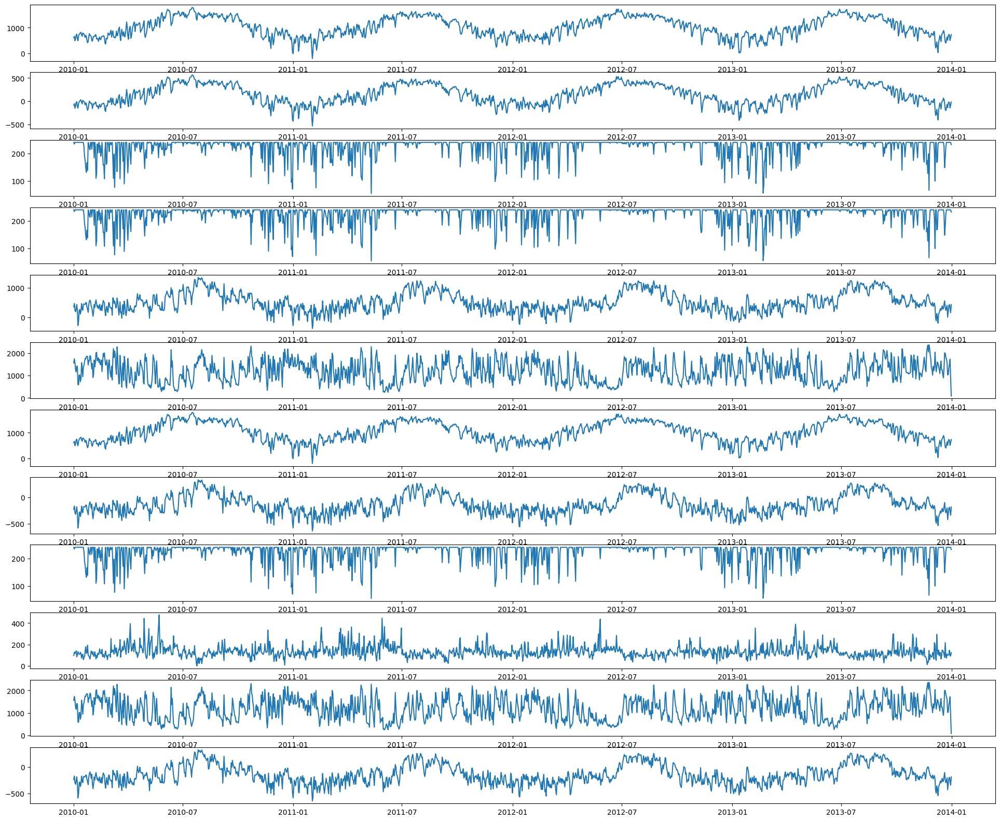

In [ ]:
# Сезонность внутри недели
draw_resampled(wth, 'D', 12)

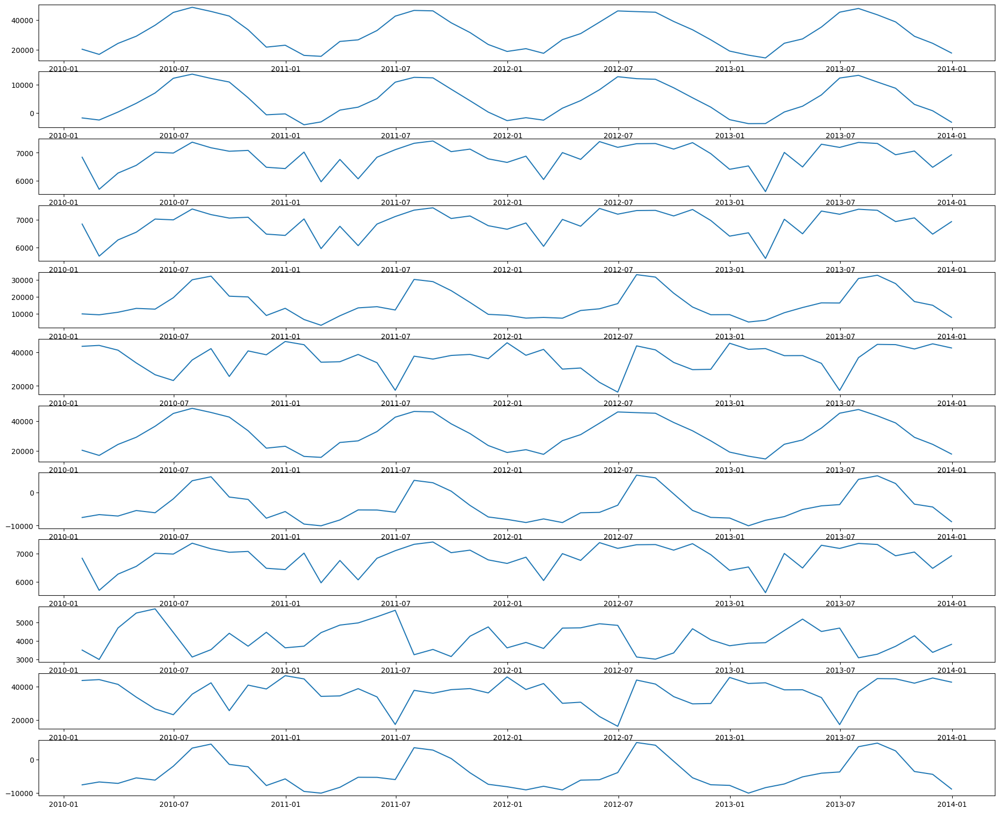

In [ ]:
# Сезонность внутри месяца
draw_resampled(wth, 'M', 12)

Ряды очень разнородны. Сезонность так же различается от ряда к ряду.

In [ ]:
# Perform Linear Regression and calculate the gradient/slope
lr_df = calculate_slope(wth, location_col = 'id', quantity_col = 'value', location_list = wth['id'].unique())
tau_df = calculate_tau(wth, location_col = 'id', quantity_col = 'value', location_list = wth['id'].unique())

In [ ]:
lr_df

,gradient,mae,mean,r2_score,mape
7,0.000010,1.109459,9.385894,0.002265,0.118205
4,0.000026,14.382866,42.979438,0.000244,0.334645
3,0.000015,7.948368,6.125000,0.000271,1.297693
9,0.000036,10.447761,33.717944,0.000815,0.309858
2,0.000099,11.701619,21.713068,0.004729,0.538921
1,0.000056,6.478434,-5.677247,0.004910,-1.141122
5,0.000074,21.440594,49.843344,0.000883,0.430160
11,-0.000016,3.708466,5.651580,0.001107,0.656182
10,-0.000693,83.982219,132.617528,0.004715,0.633266
6,0.000002,0.140761,21.530753,0.015485,0.006538


In [ ]:
lr_df.sort_values("gradient", key = lambda x: abs(x), ascending=False)[['gradient']].style.bar(subset = 'gradient',align='mid', color=['#d65f5f', '#5fba7d'])

,gradient
10,-0.000693
2,0.000099
5,0.000074
1,0.000056
9,0.000036
8,0.000027
4,0.000026
11,-0.000016
3,0.000015
7,0.000010


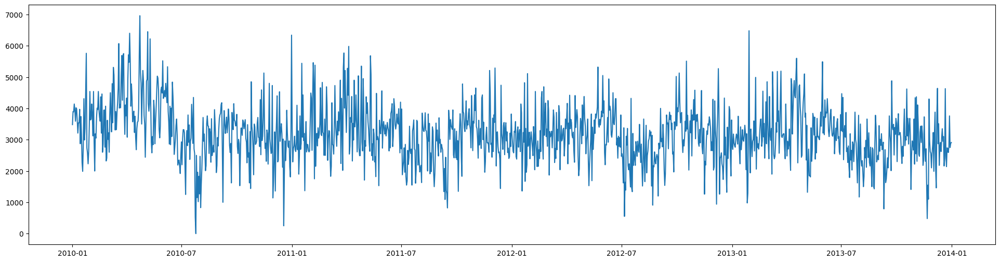

In [ ]:
draw_resampled(wth[wth['id'] == 10], 'D', 1)